# Topic: Team detection based on image embeddings

In [35]:
import os
import plotly.express as px
import numpy as np
import pandas as pd

from ultralytics import YOLO
from PIL import Image


#### Step 1: load image data & trained model

In [36]:
#load images
frame_files = os.listdir('../data/processed/ultimate_detect/images/train/')
frames = [ Image.open('../data/processed/ultimate_detect/images/train/' + frame_file) 
        for frame_file in frame_files]

#load YOLOv8 model

model = YOLO('./model/best.pt')

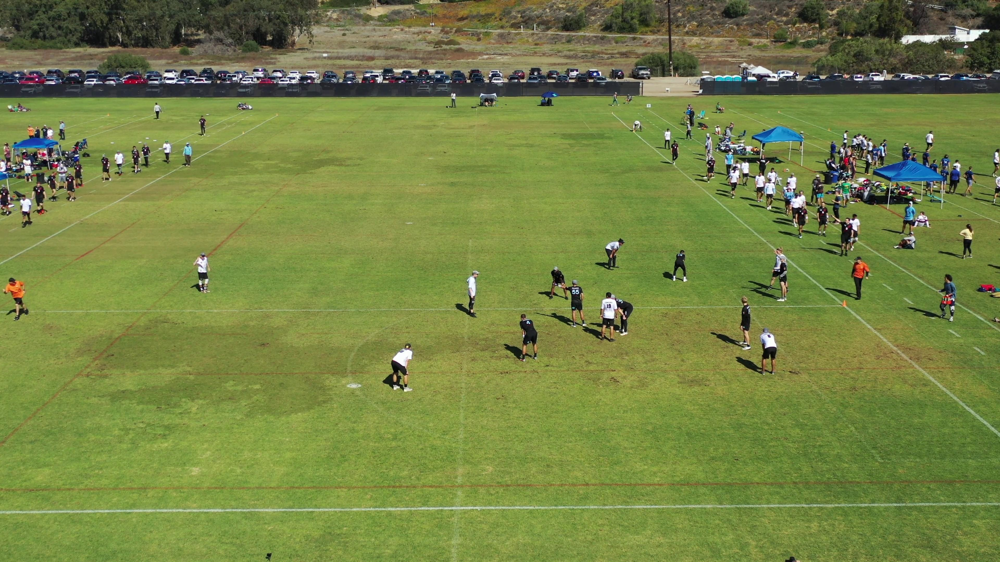

In [37]:
frame = frames[19]
frame

#### Step 2: Extract players using object detection model

In [38]:

#detect players and extract subimages
results = model.predict(frame, conf=0.2)

player_imgs = []
for result in results:
    for cls, box in zip(result.boxes.cls.tolist(), result.boxes.xyxy.tolist()):
        if cls == 0:
            #crop player boxes
            cropped_img = frame.crop(box).resize((128, 256))
            player_imgs.append(cropped_img)       


0: 2176x3840 17 Players, 1 Disc, 1 Referee, 128.7ms
Speed: 40.9ms preprocess, 128.7ms inference, 2.0ms postprocess per image at shape (1, 3, 2176, 3840)


In [39]:
#show extracted players

import plotly.subplots as sp
import plotly.express as px

def plot_list_of_players(img_list:list[Image.Image],pred_labels:list[str] = None):
    fig = sp.make_subplots(rows=1, cols=len(img_list))

    for i, img in enumerate(img_list, start=1):
        fig.add_trace(
            px.imshow(img).data[0],
            row=1, col=i
        )
        
        if pred_labels is not None:
            fig.update_xaxes(title_text=str(pred_labels[i-1]), row=1, col=i)
    
    fig.show()

## Approach 1: Flatten image + Kmeans clustering

In [40]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


data = np.array([np.array(img).flatten() for img in player_imgs])

#Kmeans clustering
kmeans = KMeans(n_clusters=2)
pred_labels = kmeans.fit_predict(data)

# Run PCA
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data)

# Convert the PCA-reduced embeddings to a DataFrame
df = pd.DataFrame(data_pca, columns=['Component 1', 'Component 2', 'Component 3'])

# Plot the PCA-reduced embeddings
fig = px.scatter_3d(df, x='Component 1', y='Component 2', z='Component 3', color=pred_labels)
fig.show()

## plot players and predicted labels

In [41]:
plot_list_of_players(player_imgs,pred_labels)

# Approach 2: Take upper images + Flatten + KMeans Clustering

In [42]:
upper_player_imgs = []
for img in player_imgs:
    width, height = img.size
    upper_img = img.crop((0, 0, width, height // 2))
    upper_player_imgs.append(upper_img)
    

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


data = np.array([np.array(img).flatten() for img in upper_player_imgs])

#Kmeans clustering
kmeans = KMeans(n_clusters=2)
pred_labels = kmeans.fit_predict(data)

# Run PCA
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data)

# Convert the PCA-reduced embeddings to a DataFrame
df = pd.DataFrame(data_pca, columns=['Component 1', 'Component 2', 'Component 3'])

# Plot the PCA-reduced embeddings
fig = px.scatter_3d(df, x='Component 1', y='Component 2', z='Component 3', color=pred_labels)
fig.show()

In [43]:
plot_list_of_players(upper_player_imgs,pred_labels)

# Approach 3: Sort upper part images by brightness

In [44]:
from PIL import ImageOps

mean_intensities = [np.mean(np.array(img)) for img in upper_player_imgs]

df = pd.DataFrame({"id": list(range(len(upper_player_imgs))),
                   "mean_intensity": mean_intensities})
df_sorted = df.sort_values('mean_intensity')

half_point = len(df_sorted) // 2
df_sorted['label'] = [0 if i < half_point else 1 for i in range(len(df_sorted))]

df_sorted = df_sorted.sort_values('id')


In [45]:
plot_list_of_players(upper_player_imgs, list(df_sorted.label))

# Optional Approach: reduce colors using kmeans

In [46]:
from sklearn.cluster import KMeans

def train_kmeans(player_imgs: list[Image.Image], 
                 n_colors: int = 3) -> tuple[KMeans, np.ndarray]:
    """ Train a KMeans model to identify the most representative colors (n_colors)
        in a list of images.
        Args:
            player_imgs: list of player images
            n_colors: number of colors to identify in the color palette
        Returns:
            KMeans model
            identified_palette: list of RGB colors identified as the most representative
            
    """
    
    flatten_imgs = [np.array(img).reshape(-1,3) for img in player_imgs]
    pixels_imgs = np.concatenate(flatten_imgs, axis=0)

    kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(pixels_imgs)
    identified_palette = np.array(kmeans.cluster_centers_).astype(int)
    
    return kmeans, identified_palette

def recolor_image(kmeans: KMeans, 
                  player_img: Image.Image) -> Image.Image:
    """ Predict the color palette of the player images using the KMeans model.
        Args:
            kmeans: KMeans model
            player_imgs: list of player images
        Returns:
            Image with the color palette applied
    """
    
    w,h,_ = np.array(player_img).shape
    player_img = np.array(player_img).reshape(-1,3)
    
    labels = kmeans.predict(player_img)
    identified_palette = np.array(kmeans.cluster_centers_).astype(int)
    
    recolored_img = np.copy(player_img)
    for index in range(len(recolored_img)):
        recolored_img[index] = identified_palette[labels[index]]
    recolored_img = recolored_img.reshape(w,h,3)
    
    return Image.fromarray(recolored_img)

### plot transformed images

In [47]:
kmeans, colors = train_kmeans(upper_player_imgs, n_colors=3)
recolored_imgs = [recolor_image(kmeans, img) for img in upper_player_imgs]

In [48]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

data = np.array([np.array(img).flatten() for img in recolored_imgs])

#Kmeans clustering
kmeans = KMeans(n_clusters=2)
pred_labels = kmeans.fit_predict(data)

# Run PCA
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data)

# Convert the PCA-reduced embeddings to a DataFrame
df = pd.DataFrame(data_pca, columns=['Component 1', 'Component 2', 'Component 3'])

# Plot the PCA-reduced embeddings
fig = px.scatter_3d(df, x='Component 1', y='Component 2', z='Component 3', color=pred_labels)
fig.show()

In [49]:
plot_list_of_players(recolored_imgs,pred_labels)